In [1]:
import numpy as np 
import pandas as pd 
from pandas import DataFrame 

import matplotlib.pyplot as plt 
import seaborn as sns
import itertools
%matplotlib inline
from matplotlib.pyplot import figure
import matplotlib as mpl
import matplotlib.font_manager as fm
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = 'Malgun Gothic' 
plt.rcParams["font.size"] = 10
%matplotlib inline 


from datetime import datetime, timedelta 
from statsmodels.tsa.arima_model import ARIMA 

from sklearn.preprocessing import StandardScaler
import os

In [2]:
test = pd.read_csv("data/test.csv", sep = ",")
train = pd.read_csv("data/train.csv", sep =",")
submission = pd.read_csv("data/submission.csv")

In [3]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster

In [4]:
train.tail(2)

,Time,X692,X1272,X553,X1299,X4,X598,X1003,X1010,X1216,...,X1164,X656,X1287,X324,X767,X1271,X1288,X58,X1033,X1163
16907,2018-06-30 22:00,0.379,0.494,0.605,0.320,NaN,0.555,0.604,1.044,0.412,...,0.567,0.504,0.384,0.21,1.019,1.055,0.735,7.150,0.393,0.629
16908,2018-06-30 23:00,0.388,0.482,0.651,0.284,NaN,0.452,0.629,1.116,0.400,...,0.495,0.410,0.343,0.42,0.746,0.738,0.689,8.346,0.323,0.422


In [5]:
## Number of NaNs in Train
train.isnull().sum().sort_values(ascending=False)

## Number of NaNs in Test
test.isnull().sum().sort_values(ascending=False)

X42     7005
X18     7003
X41     7003
X31     7003
X44     7003
X37     7003
X32     7003
X50     7003
X16     7003
X61     7003
X51     7003
X7      7003
X62     7003
X35     7003
X30     7003
X5      7003
X26     7003
X55     7003
X20     7003
X43     7003
X47     7003
X10     7003
X59     7003
X481    4583
X155    2675
X312    2460
X276    2274
X275    2253
X455    2232
X462    2147
        ... 
X303    1852
X460    1850
X133    1822
X192    1801
X329    1698
X73      112
X125       0
X70        0
X88        0
X67        0
X87        0
X91        0
X75        0
X107       0
X102       0
X126       0
X120       0
X123       0
X110       0
X80        0
X76        0
X106       0
X82        0
X105       0
X124       0
X94        0
X68        0
X116       0
X111       0
Time       0
Length: 201, dtype: int64

In [6]:
train.Time = pd.to_datetime(train.Time)
test.Time = pd.to_datetime(test.Time)

In [7]:
traintest = pd.merge(train, test, on ='Time', how = 'outer')
traintest

,Time,X692,X1272,X553,X1299,X4,X598,X1003,X1010,X1216,...,X283,X329,X223,X266,X20,X443,X347,X75,X107,X230
0,2016-07-26 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-07-26 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-07-26 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-07-26 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-07-26 15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2016-07-26 16:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016-07-26 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-07-26 18:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2016-07-26 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2016-07-26 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
traintest2 = traintest.copy()
traintest2 = pd.melt(traintest2, id_vars=['Time'])
traintest2.tail()

,Time,variable,value
25363495,2018-06-30 19:00:00,X230,0.286
25363496,2018-06-30 20:00:00,X230,0.303
25363497,2018-06-30 21:00:00,X230,0.253
25363498,2018-06-30 22:00:00,X230,0.253
25363499,2018-06-30 23:00:00,X230,0.310


In [9]:
traintest3 = traintest2.copy()

In [10]:
# train4 = train3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()
# train4.head(2)

In [11]:
# train5 = train4.copy()
traintest3['lag1d'] = traintest3.groupby(['variable'])['value'].shift(24)
traintest3['lag7d'] = traintest3.groupby(['variable'])['value'].shift(168)
traintest3 = traintest3.fillna(0)
traintest3['ratio1d'] = traintest3['value']/(traintest3['lag1d']+1)
traintest3['ratio7d'] = traintest3['value']/(traintest3['lag7d']+1)
traintest3.head(2)

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
0,2016-07-26 11:00:00,X692,0.0,0.0,0.0,0.0,0.0
1,2016-07-26 12:00:00,X692,0.0,0.0,0.0,0.0,0.0


In [12]:
traintest3.tail(2)

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
25363498,2018-06-30 22:00:00,X230,0.253,0.000,0.472,0.253000,0.171875
25363499,2018-06-30 23:00:00,X230,0.310,0.061,0.606,0.292177,0.193026


In [13]:
traintest4 = traintest3.groupby(['variable']).agg({'ratio1d':'mean','ratio7d':'mean'}).reset_index()
featureTT = traintest4.copy()

In [14]:
traintest4.head(2)

,variable,ratio1d,ratio7d
0,X1,0.000000,0.000000
1,X10,0.084523,0.099492


In [15]:
## X1 의 ratio1d, ratio7d가 모두 0이라서 확인
## 실제로 이 값은 모두 NaN임을 알 수 있다. 위에서 train셋의 NaN 개수로 sorting했을 때 또 확인 가능
traintest3[traintest3.variable == 'X1']

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
17314816,2016-07-26 11:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314817,2016-07-26 12:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314818,2016-07-26 13:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314819,2016-07-26 14:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314820,2016-07-26 15:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314821,2016-07-26 16:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314822,2016-07-26 17:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314823,2016-07-26 18:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314824,2016-07-26 19:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314825,2016-07-26 20:00:00,X1,0.0,0.0,0.0,0.0,0.0


In [16]:
# featureTT['id'] = [int(s[1:]) for s in featureTT['variable']]
# featureTT2 = featureTT.iloc[:, 1:]
featureTT2 = featureTT.set_index('variable')

In [61]:
featureTT2.head()

,ratio1d,ratio7d
variable,,
X1,0.000000,0.000000
X10,0.084523,0.099492
X100,0.488376,0.461915
X1000,0.063058,0.064903
X1001,0.076958,0.080259


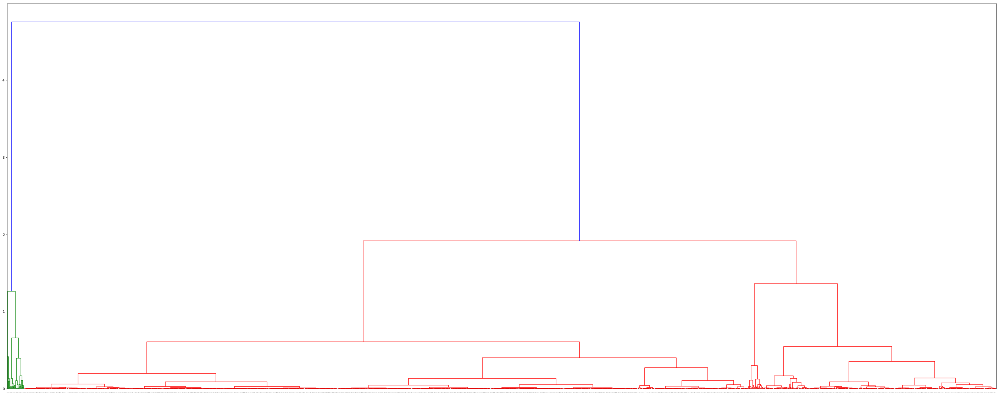

In [17]:
Z = linkage(featureTT2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1, 
           labels=featureTT2.index)
plt.show()

In [18]:
Z

array([[0.00000000e+00, 6.35000000e+02, 0.00000000e+00, 2.00000000e+00],
       [6.57000000e+02, 1.50000000e+03, 0.00000000e+00, 3.00000000e+00],
       [7.23000000e+02, 1.50100000e+03, 0.00000000e+00, 4.00000000e+00],
       ...,
       [2.98700000e+03, 2.99200000e+03, 1.36032117e+00, 3.76000000e+02],
       [2.99300000e+03, 2.99600000e+03, 1.91451785e+00, 1.47400000e+03],
       [2.99500000e+03, 2.99700000e+03, 4.75166986e+00, 1.50000000e+03]])

In [ ]:
import plotly.figure_factory as ff

figure = ff.create_dendrogram(
    data_array, orientation='bottom', labels=id_label_list,
    linkagefun=lambda x: linkage(data_array, 'ward', metric='euclidean')
)


X = np.random.rand(10, 12)
names = ['Jack', 'Oxana', 'John', 'Chelsea', 'Mark', 'Alice', 'Charlie', 'Rob', 'Lisa', 'Lily']
fig = ff.create_dendrogram(X, orientation='left', labels=names)
fig.update_layout(width=800, height=800)
fig.show()

In [55]:
k=3
featureTT3 = featureTT2.copy()

predict = fcluster(Z, k, criterion = 'maxclust')
featureTT3['cluster']=predict
traintest4 = pd.merge(traintest3, featureTT3, on ='variable',how='left')

c_1T = traintest4[traintest4['cluster']==1]
c_2T = traintest4[traintest4['cluster']==2]
c_3T = traintest4[traintest4['cluster']==3]
c_4T = traintest4[traintest4['cluster']==4]
c_5T = traintest4[traintest4['cluster']==5]

In [56]:
traintest4

,Time,variable,value,lag1d,lag7d,ratio1d_x,ratio7d_x,ratio1d_y,ratio7d_y,cluster
0,2016-07-26 11:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
1,2016-07-26 12:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
2,2016-07-26 13:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
3,2016-07-26 14:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
4,2016-07-26 15:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
5,2016-07-26 16:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
6,2016-07-26 17:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
7,2016-07-26 18:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
8,2016-07-26 19:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2
9,2016-07-26 20:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,2


In [57]:
cnt_srs_1T = c_1T.groupby('Time')['value'].mean()
cnt_srs_2T = c_2T.groupby('Time')['value'].mean()
cnt_srs_3T = c_3T.groupby('Time')['value'].mean()
cnt_srs_4T = c_4T.groupby('Time')['value'].mean()
cnt_srs_5T = c_4T.groupby('Time')['value'].mean()

In [58]:
import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

In [59]:
trace_1T = scatter_plot(cnt_srs_1T, 'yellow', True ,'Cluster_1')
trace_2T = scatter_plot(cnt_srs_2T, 'green', True ,'Cluster_2')
trace_3T = scatter_plot(cnt_srs_3T, 'red', True ,'Cluster_3')
trace_4T = scatter_plot(cnt_srs_4T, 'grey', True ,'Cluster_4')
trace_5T = scatter_plot(cnt_srs_5T, 'white', True ,'Cluster_5')

In [63]:
import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Train Clustering_3'
)

data = [trace_1T,trace_2T, trace_3T]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

In [64]:
traintest4.groupby('cluster')['variable'].nunique()

cluster
1      26
2    1098
3     376
Name: variable, dtype: int64

In [62]:


# TEST에서 각각의 클러스터에 해당하는 ID 추출
c1_testID = np.unique(traintest4[traintest4.cluster==1]['variable'])
c2_testID = np.unique(traintest4[traintest4.cluster==2]['variable'])
c3_testID = np.unique(traintest4[traintest4.cluster==3]['variable'])

print(c1_testID,'\n',c2_testID,'\n', c3_testID)

['X100' 'X101' 'X103' 'X104' 'X113' 'X114' 'X115' 'X119' 'X121' 'X68'
 'X69' 'X77' 'X78' 'X79' 'X80' 'X81' 'X83' 'X84' 'X85' 'X86' 'X87' 'X89'
 'X90' 'X93' 'X97' 'X98'] 
 ['X1' 'X1000' 'X1002' ... 'X997' 'X998' 'X999'] 
 ['X10' 'X1001' 'X102' 'X105' 'X1052' 'X106' 'X107' 'X108' 'X109' 'X1091'
 'X110' 'X111' 'X1113' 'X112' 'X116' 'X1165' 'X12' 'X120' 'X122' 'X123'
 'X124' 'X125' 'X126' 'X1260' 'X128' 'X129' 'X1292' 'X130' 'X131' 'X132'
 'X133' 'X134' 'X135' 'X1355' 'X136' 'X137' 'X1376' 'X138' 'X1389' 'X139'
 'X140' 'X141' 'X1410' 'X1417' 'X142' 'X1424' 'X144' 'X145' 'X147' 'X148'
 'X1486' 'X149' 'X15' 'X150' 'X151' 'X152' 'X153' 'X154' 'X155' 'X156'
 'X157' 'X158' 'X159' 'X16' 'X160' 'X161' 'X163' 'X164' 'X165' 'X166'
 'X167' 'X168' 'X169' 'X170' 'X171' 'X173' 'X174' 'X175' 'X176' 'X177'
 'X178' 'X179' 'X18' 'X180' 'X182' 'X184' 'X185' 'X186' 'X187' 'X188'
 'X189' 'X190' 'X191' 'X192' 'X193' 'X194' 'X195' 'X196' 'X197' 'X198'
 'X199' 'X200' 'X201' 'X202' 'X203' 'X204' 'X205' 'X206' 'X2

In [6]:
train.Time = pd.to_datetime(train.Time)
test.Time = pd.to_datetime(test.Time)

In [7]:
traintest = pd.merge(train, test, on ='Time', how = 'outer')
traintest

,Time,X692,X1272,X553,X1299,X4,X598,X1003,X1010,X1216,...,X283,X329,X223,X266,X20,X443,X347,X75,X107,X230
0,2016-07-26 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-07-26 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-07-26 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-07-26 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-07-26 15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2016-07-26 16:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016-07-26 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-07-26 18:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2016-07-26 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2016-07-26 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
traintest2 = traintest.copy()
traintest2 = pd.melt(traintest2, id_vars=['Time'])
traintest2.tail()

,Time,variable,value
25363495,2018-06-30 19:00:00,X230,0.286
25363496,2018-06-30 20:00:00,X230,0.303
25363497,2018-06-30 21:00:00,X230,0.253
25363498,2018-06-30 22:00:00,X230,0.253
25363499,2018-06-30 23:00:00,X230,0.310


In [9]:
traintest3 = traintest2.copy()

In [10]:
# train4 = train3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()
# train4.head(2)

In [11]:
# train5 = train4.copy()
traintest3['lag1d'] = traintest3.groupby(['variable'])['value'].shift(24)
traintest3['lag7d'] = traintest3.groupby(['variable'])['value'].shift(168)
traintest3 = traintest3.fillna(0)
traintest3['ratio1d'] = traintest3['value']/(traintest3['lag1d']+1)
traintest3['ratio7d'] = traintest3['value']/(traintest3['lag7d']+1)
traintest3.head(2)

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
0,2016-07-26 11:00:00,X692,0.0,0.0,0.0,0.0,0.0
1,2016-07-26 12:00:00,X692,0.0,0.0,0.0,0.0,0.0


In [12]:
traintest3.tail(2)

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
25363498,2018-06-30 22:00:00,X230,0.253,0.000,0.472,0.253000,0.171875
25363499,2018-06-30 23:00:00,X230,0.310,0.061,0.606,0.292177,0.193026


In [13]:
traintest4 = traintest3.groupby(['variable']).agg({'ratio1d':'mean','ratio7d':'mean'}).reset_index()
featureTT = traintest4.copy()

In [14]:
traintest4.head(2)

,variable,ratio1d,ratio7d
0,X1,0.000000,0.000000
1,X10,0.084523,0.099492


In [15]:
## X1 의 ratio1d, ratio7d가 모두 0이라서 확인
## 실제로 이 값은 모두 NaN임을 알 수 있다. 위에서 train셋의 NaN 개수로 sorting했을 때 또 확인 가능
traintest3[traintest3.variable == 'X1']

,Time,variable,value,lag1d,lag7d,ratio1d,ratio7d
17314816,2016-07-26 11:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314817,2016-07-26 12:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314818,2016-07-26 13:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314819,2016-07-26 14:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314820,2016-07-26 15:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314821,2016-07-26 16:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314822,2016-07-26 17:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314823,2016-07-26 18:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314824,2016-07-26 19:00:00,X1,0.0,0.0,0.0,0.0,0.0
17314825,2016-07-26 20:00:00,X1,0.0,0.0,0.0,0.0,0.0


In [16]:
# featureTT['id'] = [int(s[1:]) for s in featureTT['variable']]
# featureTT2 = featureTT.iloc[:, 1:]
featureTT2 = featureTT.set_index('variable')

In [61]:
featureTT2.head()

,ratio1d,ratio7d
variable,,
X1,0.000000,0.000000
X10,0.084523,0.099492
X100,0.488376,0.461915
X1000,0.063058,0.064903
X1001,0.076958,0.080259


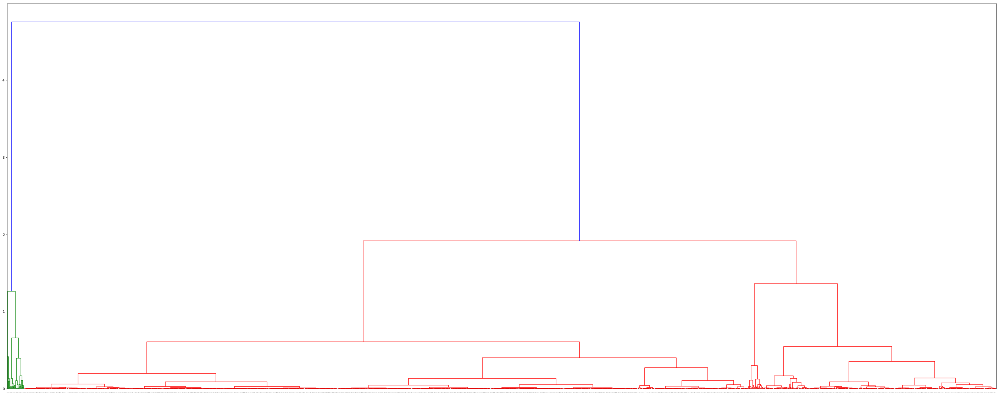

In [17]:
Z = linkage(featureTT2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1, 
           labels=featureTT2.index)
plt.show()

In [18]:
Z

array([[0.00000000e+00, 6.35000000e+02, 0.00000000e+00, 2.00000000e+00],
       [6.57000000e+02, 1.50000000e+03, 0.00000000e+00, 3.00000000e+00],
       [7.23000000e+02, 1.50100000e+03, 0.00000000e+00, 4.00000000e+00],
       ...,
       [2.98700000e+03, 2.99200000e+03, 1.36032117e+00, 3.76000000e+02],
       [2.99300000e+03, 2.99600000e+03, 1.91451785e+00, 1.47400000e+03],
       [2.99500000e+03, 2.99700000e+03, 4.75166986e+00, 1.50000000e+03]])

In [ ]:
import plotly.figure_factory as ff

figure = ff.create_dendrogram(
    data_array, orientation='bottom', labels=id_label_list,
    linkagefun=lambda x: linkage(data_array, 'ward', metric='euclidean')
)


X = np.random.rand(10, 12)
names = ['Jack', 'Oxana', 'John', 'Chelsea', 'Mark', 'Alice', 'Charlie', 'Rob', 'Lisa', 'Lily']
fig = ff.create_dendrogram(X, orientation='left', labels=names)
fig.update_layout(width=800, height=800)
fig.show()

In [44]:
k=5
featureTT3 = featureTT2.copy()

predict = fcluster(Z, k, criterion = 'maxclust')
featureTT3['cluster']=predict
traintest4 = pd.merge(traintest3, featureTT3, on ='variable',how='left')

c_1T = traintest4[traintest4['cluster']==1]
c_2T = traintest4[traintest4['cluster']==2]
c_3T = traintest4[traintest4['cluster']==3]
c_4T = traintest4[traintest4['cluster']==4]
c_5T = traintest4[traintest4['cluster']==5]

In [45]:
traintest4

,Time,variable,value,lag1d,lag7d,ratio1d_x,ratio7d_x,ratio1d_y,ratio7d_y,cluster
0,2016-07-26 11:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
1,2016-07-26 12:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
2,2016-07-26 13:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
3,2016-07-26 14:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
4,2016-07-26 15:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
5,2016-07-26 16:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
6,2016-07-26 17:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
7,2016-07-26 18:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
8,2016-07-26 19:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3
9,2016-07-26 20:00:00,X692,0.000,0.000,0.000,0.000000,0.000000,0.050119,0.051315,3


In [47]:
cnt_srs_1T = c_1T.groupby('Time')['value'].mean()
cnt_srs_2T = c_2T.groupby('Time')['value'].mean()
cnt_srs_3T = c_3T.groupby('Time')['value'].mean()
cnt_srs_4T = c_4T.groupby('Time')['value'].mean()
cnt_srs_5T = c_4T.groupby('Time')['value'].mean()

In [48]:
import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

In [52]:
trace_1T = scatter_plot(cnt_srs_1T, 'yellow', True ,'Cluster_1')
trace_2T = scatter_plot(cnt_srs_2T, 'green', True ,'Cluster_2')
trace_3T = scatter_plot(cnt_srs_3T, 'red', True ,'Cluster_3')
trace_4T = scatter_plot(cnt_srs_4T, 'grey', True ,'Cluster_4')
trace_5T = scatter_plot(cnt_srs_5T, 'white', True ,'Cluster_5')

In [53]:
import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Train Clustering_3'
)

data = [trace_1T,trace_2T, trace_3T, trace_4T, trace_5T]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

In [ ]:
train.Time = pd.to_datetime(train.Time)
test.Time = pd.to_datetime(test.Time)

traintest = pd.merge(train, test, on ='Time', how = 'outer')
traintest

traintest2 = traintest.copy()
traintest2 = pd.melt(traintest2, id_vars=['Time'])
traintest2.tail()

traintest3 = traintest2.copy()

# train4 = train3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()
# train4.head(2)

# train5 = train4.copy()
traintest3['lag1d'] = traintest3.groupby(['variable'])['value'].shift(24)
traintest3['lag7d'] = traintest3.groupby(['variable'])['value'].shift(168)
traintest3 = traintest3.fillna(0)
traintest3['ratio1d'] = traintest3['value']/(traintest3['lag1d']+1)
traintest3['ratio7d'] = traintest3['value']/(traintest3['lag7d']+1)
traintest3.head(2)

traintest3.tail(2)

traintest4 = traintest3.groupby(['variable']).agg({'ratio1d':'mean','ratio7d':'mean'}).reset_index()
featureTT = traintest4.copy()

traintest4.head(2)

## X1 의 ratio1d, ratio7d가 모두 0이라서 확인
## 실제로 이 값은 모두 NaN임을 알 수 있다. 위에서 train셋의 NaN 개수로 sorting했을 때 또 확인 가능
traintest3[traintest3.variable == 'X1']

# featureTT['id'] = [int(s[1:]) for s in featureTT['variable']]
# featureTT2 = featureTT.iloc[:, 1:]
featureTT2 = featureTT.set_index('variable')

featureTT2.head()

Z = linkage(featureTT2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1, 
           labels=featureTT2.index)
plt.show()

Z

import plotly.figure_factory as ff

figure = ff.create_dendrogram(
    data_array, orientation='bottom', labels=id_label_list,
    linkagefun=lambda x: linkage(data_array, 'ward', metric='euclidean')
)


X = np.random.rand(10, 12)
names = ['Jack', 'Oxana', 'John', 'Chelsea', 'Mark', 'Alice', 'Charlie', 'Rob', 'Lisa', 'Lily']
fig = ff.create_dendrogram(X, orientation='left', labels=names)
fig.update_layout(width=800, height=800)
fig.show()

k=5
featureTT3 = featureTT2.copy()

predict = fcluster(Z, k, criterion = 'maxclust')
featureTT3['cluster']=predict
traintest4 = pd.merge(traintest3, featureTT3, on ='variable',how='left')

c_1T = traintest4[traintest4['cluster']==1]
c_2T = traintest4[traintest4['cluster']==2]
c_3T = traintest4[traintest4['cluster']==3]
c_4T = traintest4[traintest4['cluster']==4]
c_5T = traintest4[traintest4['cluster']==5]

traintest4

cnt_srs_1T = c_1T.groupby('Time')['value'].mean()
cnt_srs_2T = c_2T.groupby('Time')['value'].mean()
cnt_srs_3T = c_3T.groupby('Time')['value'].mean()
cnt_srs_4T = c_4T.groupby('Time')['value'].mean()
cnt_srs_5T = c_4T.groupby('Time')['value'].mean()

import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

trace_1T = scatter_plot(cnt_srs_1T, 'yellow', True ,'Cluster_1')
trace_2T = scatter_plot(cnt_srs_2T, 'green', True ,'Cluster_2')
trace_3T = scatter_plot(cnt_srs_3T, 'red', True ,'Cluster_3')
trace_4T = scatter_plot(cnt_srs_4T, 'grey', True ,'Cluster_4')
trace_5T = scatter_plot(cnt_srs_5T, 'white', True ,'Cluster_5')

import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Train Clustering_3'
)

data = [trace_1T,trace_2T, trace_3T, trace_4T, trace_5T]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

In [ ]:
test2.reset_index(level=0, inplace=True)
v = test2.columns[1:12]
test3 = pd.melt(test2, id_vars=['Time'], value_vars=test2.columns[1:1292])

In [ ]:
test4 = test3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()

In [ ]:
test5 = test4.copy()
test5['lag1'] = test5.groupby(['variable'])['value'].shift(1)
test5['lag7'] = test5.groupby(['variable'])['value'].shift(7)
test5 = test5.fillna(0)
test5['ratio1'] = test5['value']/(test5['lag1']+1)
test5['ratio7'] = test5['value']/(test5['lag7']+1)
test5.head(2)

In [ ]:
test6 = test5.groupby(['variable']).agg({'ratio1':'mean','ratio7':'mean'}).reset_index()
feature = test6
plt.scatter(feature['ratio1'], feature['ratio7'])

In [ ]:
feature['id'] = [int(s[1:]) for s in feature['variable']]
feature2 = feature.iloc[:, 1:]
feature2

In [ ]:
Z = linkage(feature2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1,
)
plt.show()

In [ ]:
feature3 = feature.copy()
feature3 = feature3.drop(columns='id')

In [ ]:
k=3

predict = fcluster(Z, k, criterion = 'maxclust')
feature3['cluster']=predict
test7 = pd.merge(test5, feature3, on ='variable',how='left')

c_1 = test7[test7['cluster']==1]
c_2 = test7[test7['cluster']==2]
c_3 = test7[test7['cluster']==3]
# c_4 = test7[test7['cluster']==4]

In [ ]:
cnt_srs_1 = c_1.groupby('Time')['value'].mean()
cnt_srs_2 = c_2.groupby('Time')['value'].mean()
cnt_srs_3 = c_3.groupby('Time')['value'].mean()
# cnt_srs_4 = c_4.groupby('Time')['value'].mean()

In [ ]:
import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

In [ ]:
trace_1 = scatter_plot(cnt_srs_1, 'yellow', True ,'Cluster_1')
trace_2 = scatter_plot(cnt_srs_2, 'green', True ,'Cluster_2')
trace_3 = scatter_plot(cnt_srs_3, 'red', True ,'Cluster_3')
# trace_4 = scatter_plot(cnt_srs_3, 'grey', True ,'Cluster_3')

In [ ]:
import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Test Clustering_2'
)

data = [trace_1,trace_2, trace_3]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

In [ ]:
test7.groupby('cluster')['variable'].nunique()

In [ ]:
# TEST에서 각각의 클러스터에 해당하는 ID 추출
c1_testID = np.unique(test7[test7.cluster==1]['variable'])
c2_testID = np.unique(test7[test7.cluster==2]['variable'])
c3_testID = np.unique(test7[test7.cluster==3]['variable'])

In [ ]:
print(c1_testID,'\n',c2_testID,'\n', c3_testID)

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster

train2 = train.copy()
train2.reset_index(level=0, inplace=True)
v = train2.columns[1:12]
train3 = pd.melt(train2, id_vars=['Time'], value_vars=train2.columns[1:1292])

train4 = train3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()

train5 = train4.copy()
train5['lag1'] = train5.groupby(['variable'])['value'].shift(1)
train5['lag7'] = train5.groupby(['variable'])['value'].shift(7)
train5 = train5.fillna(0)
train5['ratio1'] = train5['value']/(train5['lag1']+1)
train5['ratio7'] = train5['value']/(train5['lag7']+1)
train5.head(2)

train6 = train5.groupby(['variable']).agg({'ratio1':'mean','ratio7':'mean'}).reset_index()
featureTr = train6.copy()
plt.scatter(featureTr['ratio1'], featureTr['ratio7'])

featureTr['id'] = [int(s[1:]) for s in featureTr['variable']]
featureTr2 = featureTr.iloc[:, 1:]
featureTr2

Z = linkage(featureTr2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1,
)
plt.show()

k=3
featureTr3 = featureTr.copy()
featureTr3 = featureTr3.drop(columns='id')
predict = fcluster(Z, k, criterion = 'maxclust')
featureTr3['cluster']=predict
train7 = pd.merge(train5, featureTr3, on ='variable',how='left')

c_1T = train7[train7['cluster']==1]
c_2T = train7[train7['cluster']==2]
c_3T = train7[train7['cluster']==3]

cnt_srs_1T = c_1T.groupby('Time')['value'].mean()
cnt_srs_2T = c_2T.groupby('Time')['value'].mean()
cnt_srs_3T = c_3T.groupby('Time')['value'].mean()

import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

trace_1T = scatter_plot(cnt_srs_1T, 'yellow', True ,'Cluster_1')
trace_2T = scatter_plot(cnt_srs_2T, 'green', True ,'Cluster_2')
trace_3T = scatter_plot(cnt_srs_3T, 'red', True ,'Cluster_3')

import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Train Clustering_3'
)

data = [trace_1T,trace_2T, trace_3T]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

test2 = test.copy()

test2.reset_index(level=0, inplace=True)
v = test2.columns[1:12]
test3 = pd.melt(test2, id_vars=['Time'], value_vars=test2.columns[1:1292])

test4 = test3.groupby(['Time','variable'])['value'].agg({'value':'mean'}).reset_index()

test5 = test4.copy()
test5['lag1'] = test5.groupby(['variable'])['value'].shift(1)
test5['lag7'] = test5.groupby(['variable'])['value'].shift(7)
test5 = test5.fillna(0)
test5['ratio1'] = test5['value']/(test5['lag1']+1)
test5['ratio7'] = test5['value']/(test5['lag7']+1)
test5.head(2)

test6 = test5.groupby(['variable']).agg({'ratio1':'mean','ratio7':'mean'}).reset_index()
feature = test6
plt.scatter(feature['ratio1'], feature['ratio7'])

feature['id'] = [int(s[1:]) for s in feature['variable']]
feature2 = feature.iloc[:, 1:]
feature2

Z = linkage(feature2,'ward')

plt.figure(figsize=(50,20))
dendrogram(Z,
           leaf_rotation=100,
           leaf_font_size=1,
)
plt.show()

feature3 = feature.copy()
feature3 = feature3.drop(columns='id')

k=3

predict = fcluster(Z, k, criterion = 'maxclust')
feature3['cluster']=predict
test7 = pd.merge(test5, feature3, on ='variable',how='left')

c_1 = test7[test7['cluster']==1]
c_2 = test7[test7['cluster']==2]
c_3 = test7[test7['cluster']==3]
# c_4 = test7[test7['cluster']==4]

cnt_srs_1 = c_1.groupby('Time')['value'].mean()
cnt_srs_2 = c_2.groupby('Time')['value'].mean()
cnt_srs_3 = c_3.groupby('Time')['value'].mean()
# cnt_srs_4 = c_4.groupby('Time')['value'].mean()

import plotly.graph_objs as go
def scatter_plot(cnt_srs, color, showlegend1=False, name1 = ""):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        name = name1,
        showlegend=showlegend1,
        marker=dict(
            color=color,
        ),
    )
    return trace

trace_1 = scatter_plot(cnt_srs_1, 'yellow', True ,'Cluster_1')
trace_2 = scatter_plot(cnt_srs_2, 'green', True ,'Cluster_2')
trace_3 = scatter_plot(cnt_srs_3, 'red', True ,'Cluster_3')
# trace_4 = scatter_plot(cnt_srs_3, 'grey', True ,'Cluster_3')

import plotly.offline as py
layout = go.Layout(
    height=500,
    width=1000,
    #paper_bgcolor='rgb(233,233,233)',
    title='Test Clustering_2'
)

data = [trace_1,trace_2, trace_3]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="ActivationDate")

test7.groupby('cluster')['variable'].nunique()

# TEST에서 각각의 클러스터에 해당하는 ID 추출
c1_testID = np.unique(test7[test7.cluster==1]['variable'])
c2_testID = np.unique(test7[test7.cluster==2]['variable'])
c3_testID = np.unique(test7[test7.cluster==3]['variable'])

print(c1_testID,'\n',c2_testID,'\n', c3_testID)